### read me: （for data cleaning)
1. Some data were cleaned due to incomplete or ambiguous entries.
2. However, we still have 170 samples, which is more than the minimum requirement.
3. We found that the units for screen time, study hours, and sleep were inconsistent. Therefore, we converted all of them to a standard unit of hours.
4. social_media and screen_time are time spent on them for non-academic purpose in hours after converting  

### read me: 
1. The test is going to investigate how the study hours, screen time, and social hours affect stduents sleep hours.
2. We need to control the demographical and socio-economic factors, to do this we worked through two way: 
 set these variables as dummay variables into the regression model
2.2 control these variables, and put them into the different groups and test the coefficient.

In [2]:
install.packages("GGally")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [3]:
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(dplyr)
library(ggplot2)
library(GGally)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



In [4]:
data <- read.csv("data2.csv", header = TRUE)

In [6]:
# Convert relevant variables to numeric
data <- data |> mutate(across(
  c(
    GPA,
    Hour_all_courses,
    Extra_hour_forexam,
    Coursetake.semester,
    AL_tool_Hour,
    hour_sports,
    hour_studentclub,
    hour_volunteer,
    hour_friends,
    hour_Socialize_family,
    IsDomestic,
    percent_financial_aid,
    Hour_work,
    sleep_hours,
    hour_social_media,
    Hour_screen_nonacademic,
    feeling_depress,
    Hour_commute,
  ),
  ~ as.numeric(.)
))




Warning message:
“There were 7 warnings in `mutate()`.
The first warning was:
ℹ In argument: `across(...)`.
Caused by warning:
! NAs introduced by coercion
ℹ Run `dplyr::last_dplyr_warnings()` to see the 6 remaining warnings.”


In [7]:
colnames(data) #The variables that are included

[1] "GPA"                                                                                         
 [2] "Hour_Econ326"                                                                                
 [3] "Hour_all_courses"                                                                            
 [4] "Extra_hour_forexam"                                                                          
 [5] "Coursetake.semester"                                                                         
 [6] "X7..Do.you.prefer.courses.that.focus.more.on.practical.applications.or.theoretical.concepts."
 [7] "AL_tool_Hour"                                                                                
 [8] "feel_of_AI_Tool"                                                                             
 [9] "Hour_classmaterial"                                                                          
[10] "Hour_Assignment"                                                                             
[11] "hour_sports"                                                                                 
[12] "hour_studentclub"                                                                            
[13] "hour_volunteer"                                                                              
[14] "hour_friends"                                                                                
[15] "hour_Socialize_family"                                                                       
[16] "student_type"                                                                                
[17] "IsDomestic"                                                                                  
[18] "Tuition_percourse"                                                                           
[19] "Scholarship"                                                                                 
[20] "percent_financial_aid"                                                                       
[21] "Work_or_not"                                                                                 
[22] "IsWorking"                                                                                   
[23] "work"                                                                                        
[24] "Hour_work"                                                                                   
[25] "feeling_financial_situation"                                                                 
[26] "sleep_hours"                                                                                 
[27] "minute_social_media"                                                                         
[28] "hour_social_media"                                                                           
[29] "Minute_screen_nonacademic"                                                                   
[30] "Hour_screen_nonacademic"                                                                     
[31] "feeling_depress"                                                                             
[32] "Minute_Commute"                                                                              
[33] "Hour_commute"                                                                                
[34] "Transportantion_mode"                                                                        
[35] "X30..Do.you.prefer.taking.online.courses..in.person.courses..or.a.hybrid.of.both."           
[36] "feeling_future_employ"                                                                       
[37] "Future_education"                                                                            
[38] "confidentlevel_job"                                                                          
[39] "career_path"                                                                                 
[40] "Faculty"                                                                                     
[

In [8]:
head(data) #look at data types

,GPA,Hour_Econ326,Hour_all_courses,Extra_hour_forexam,Coursetake.semester,X7..Do.you.prefer.courses.that.focus.more.on.practical.applications.or.theoretical.concepts.,AL_tool_Hour,feel_of_AI_Tool,Hour_classmaterial,Hour_Assignment,⋯,Hour_commute,Transportantion_mode,X30..Do.you.prefer.taking.online.courses..in.person.courses..or.a.hybrid.of.both.,feeling_future_employ,Future_education,confidentlevel_job,career_path,Faculty,ethnicity,X37..Which.year.are.you.in.at.your.undergraduate.program.at.UBC.
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
1,86.0,8,30,30,4.8,More practical applications,1,5,2.0,5.0,⋯,12.5,Public transit,Hybrid (mix of both),3,Yes,3,"Finance, Banking, or Investment",Faculty of Arts,East Asian,3
2,78.6,1,5,4,5.0,More practical applications,2,5,1.0,2.0,⋯,10.0,Walking,Online courses,5,Unsure,1,"Finance, Banking, or Investment",Faculty of Commerce and Business Administration (Sauder School of Business),East Asian,3
3,63.0,9,21,8,4.0,More practical applications,12,5,6.0,5.0,⋯,12.5,Public transit,Online courses,5,Yes,5,"Finance, Banking, or Investment",Faculty of Arts,East Asian,1
4,73.0,4,12,20,4.5,More practical applications,0,1,2.0,2.0,⋯,10.0,Walking,In-person courses,5,Unsure,5,Marketing or Communications,Faculty of Arts,East Asian,3
5,90.1,5,30,20,4.3,More practical applications,10,5,7.0,9.0,⋯,10.0,Walking,In-person courses,3,No,4,Entrepreneurship or Startups,Faculty of Arts,East Asian,3
6,73.0,4,20,7,5.0,More practical applications,2,4,1.5,3.5,⋯,5.0,Walking,Hybrid (mix of both),4,Yes,4,"Finance, Banking, or Investment",Other,White,1


In [9]:
data <- data |>
  slice_head(n = 168) |>#Since we have only 168 Observations, we can slice it at that point to remove NAs
    select(GPA, Hour_all_courses, Extra_hour_forexam, Coursetake.semester, AL_tool_Hour, hour_sports, hour_studentclub, hour_volunteer, hour_friends, hour_Socialize_family, IsDomestic, percent_financial_aid, Hour_work, sleep_hours, hour_social_media, Hour_screen_nonacademic, feeling_depress, Hour_commute) |>
    mutate_all(~replace(., is.na(.), 0))

           

In [10]:
tail(data) #To check if we have sliced the data correctly and selected the right columns

,GPA,Hour_all_courses,Extra_hour_forexam,Coursetake.semester,AL_tool_Hour,hour_sports,hour_studentclub,hour_volunteer,hour_friends,hour_Socialize_family,IsDomestic,percent_financial_aid,Hour_work,sleep_hours,hour_social_media,Hour_screen_nonacademic,feeling_depress,Hour_commute
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
163,90.0,20,10,3.0,10,4.0,6,5,8,7,0,0,0,6.0,3.33,1.92,2,12.5
164,75.0,21,8,4.0,12,4.0,5,3,6,8,0,0,12,6.0,3.33,2.00,4,12.5
165,70.0,8,5,4.0,5,3.0,10,0,5,3,0,0,0,6.0,2.00,3.00,4,15.0
166,72.0,20,8,4.0,6,8.0,4,2,8,5,0,0,0,6.0,4.00,4.00,4,7.5
167,79.3,14,6,3.5,1,5.5,0,0,2,2,0,0,4,8.5,0.75,3.67,1,12.5
168,84.0,10,5,4.5,2,6.0,1,0,10,2,0,0,0,7.0,3.33,5.50,3,5.0


In [11]:
class

function (x)  .Primitive("class")

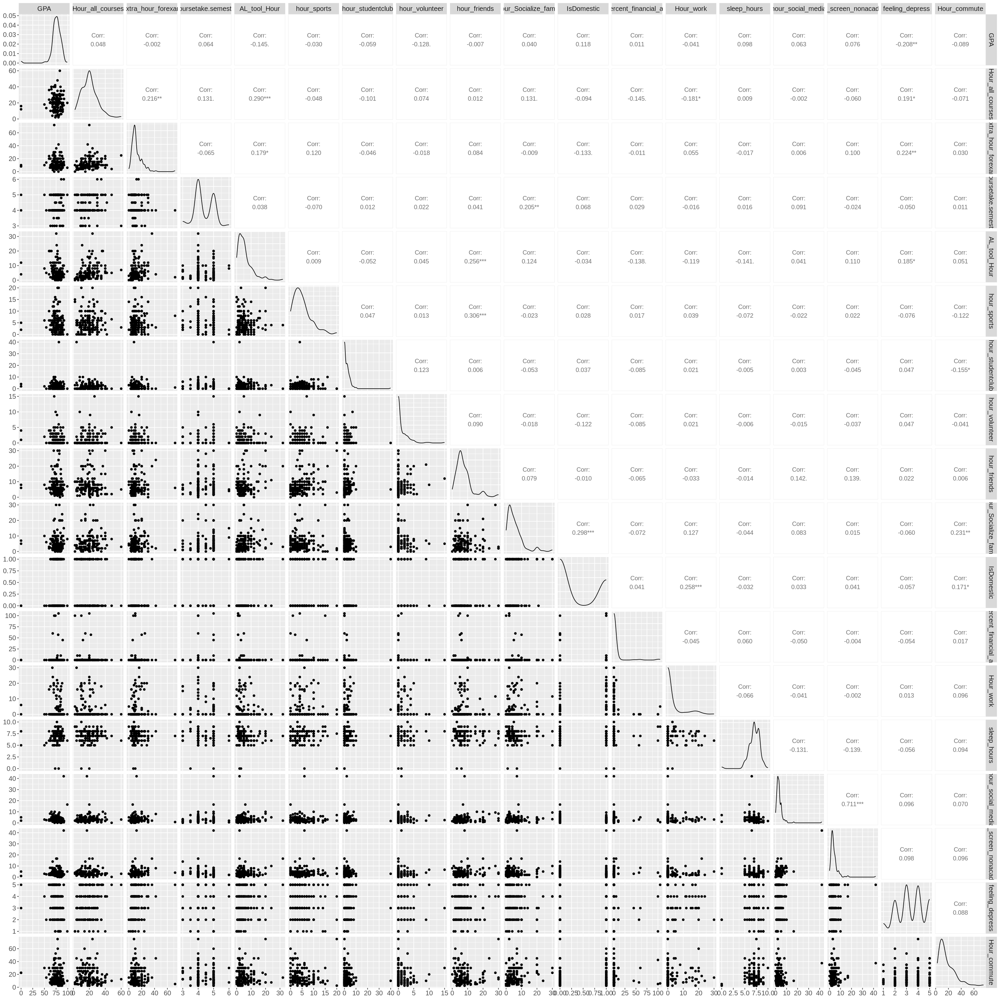

In [12]:
options(repr.plot.width = 25, repr.plot.height = 25)


class_data_pairplots <- 
    data %>%
    ggpairs(progress = FALSE) +
    theme(
        text = element_text(size = 15),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
    )

class_data_pairplots

In [ ]:
# Run regression with interaction terms
reg1 <- lm(sleep_hours ~ 
              Hour_all_courses * IsWorking + 
              minute_social_media * IsWorking + 
              Hour_screen_nonacademic * IsWorking + 
              IsDomestic,
            data = data)
summary(reg1)

In [ ]:
# H₀: Increased time spent on social media (in hours) has no effect on hours slept.
# H₁: Increased time spent on social media (in hours) has a significant effect on hours slept.


model_social <- lm(sleep_hours ~ hour_social_media, data = data)
summary(model_social)


In [ ]:
# H₀: Increased exercise hours have no effect on hours slept.
# H₁: Increased exercise hours have a significant effect on hours slept.


model_exercise <- lm(sleep_hours ~ hour_sports, data = data)
summary(model_exercise)

In [ ]:
# H₀: Increased hours spent socializing have no effect on hours slept.
# H₁: Increased hours spent socializing have a significant effect on hours slept.


data$social_hours <- data$hour_friends + data$hour_family

model_socialize <- lm(sleep_hours ~ social_hours, data = data)
summary(model_socialize)


In [ ]:
# H₀: Increased study hours have no effect on hours slept.
# H₁: Increased study hours have a significant effect on hours slept.


model_study <- lm(sleep_hours ~ Hour_all_courses, data = data)
summary(model_study)


Now we are going to test Does being an international student relate to screen or social media time?

In [ ]:
# H₀: Being an international student has no effect on social media time (in hours).
# H₁: Being an international student significantly affects social media time.

model_domestic_social <- lm(hour_social_media ~ IsDomestic, data = data)
summary(model_domestic_social)

# H₀: Being an international student has no effect on screen time (nonacademic, in hours).
# H₁: Being an international student significantly affects screen time.

model_domestic_screen <- lm(Hour_screen_nonacademic ~ IsDomestic, data = data)
summary(model_domestic_screen)


Economics-Socio factor control:  Interaction effects with working status

 Interaction effects with working status

In [ ]:
# H₀: The effect of exercise on sleep hours is the same whether or not a student works.
# H₁: The relationship between exercise and sleep differs based on working status.

model_work_exercise <- lm(sleep_hours ~ hour_sports * IsWorking, data = data)
summary(model_work_exercise)

Work * Social Media

In [ ]:
# H₀: The effect of social media use on sleep is the same regardless of working status.
# H₁: The relationship between social media use and sleep differs for working students.

model_work_social <- lm(sleep_hours ~ hour_social_media * IsWorking, data = data)
summary(model_work_social)


Work * Socialization

In [ ]:
# H₀: The effect of socialization on sleep is the same whether or not the student works.
# H₁: The relationship between socialization and sleep is affected by working status.

model_work_socialize <- lm(sleep_hours ~ social_hours * IsWorking, data = data)
summary(model_work_socialize)
